In [12]:
import pm4py
from datetime import datetime
 
# Step 1: Load the event log
log = pm4py.read_xes('InternationalDeclarations.xes', return_legacy_log_object=True)

for case in log[:1]:  # Print first case
    print(f"Case ID: {case.attributes['concept:name']}")
    for event in case:
        print(f"Activity: {event['concept:name']}, Timestamp: {event['time:timestamp']}")


parsing log, completed traces :: 100%|██████████| 6449/6449 [00:05<00:00, 1124.92it/s]


Case ID: declaration 76457
Activity: Start trip, Timestamp: 2016-10-05 00:00:00+00:00
Activity: End trip, Timestamp: 2016-10-05 00:00:00+00:00
Activity: Permit SUBMITTED by EMPLOYEE, Timestamp: 2017-04-06 13:32:10+00:00
Activity: Permit FINAL_APPROVED by SUPERVISOR, Timestamp: 2017-04-06 13:32:28+00:00
Activity: Declaration SUBMITTED by EMPLOYEE, Timestamp: 2017-04-07 13:38:14+00:00
Activity: Declaration FINAL_APPROVED by SUPERVISOR, Timestamp: 2017-04-07 13:40:17+00:00
Activity: Request Payment, Timestamp: 2017-04-11 15:03:43+00:00
Activity: Payment Handled, Timestamp: 2017-04-13 17:30:53+00:00


In [10]:
activities = {event["concept:name"] for case in log for event in case}
print("Unique activities:", ", ".join(list(activities)[:5]) + "...")


Unique activities: Declaration REJECTED by EMPLOYEE, Declaration APPROVED by SUPERVISOR, Start trip, Permit APPROVED by PRE_APPROVER, Declaration REJECTED by BUDGET OWNER...


In [11]:
import pandas as pd
df = pm4py.convert_to_dataframe(log)
print(df.columns)

Index(['id', 'org:resource', 'concept:name', 'time:timestamp', 'org:role',
       'case:Permit travel permit number', 'case:DeclarationNumber',
       'case:Amount', 'case:RequestedAmount', 'case:Permit TaskNumber',
       'case:Permit BudgetNumber', 'case:OriginalAmount',
       'case:Permit ProjectNumber', 'case:concept:name',
       'case:Permit OrganizationalEntity', 'case:travel permit number',
       'case:Permit RequestedBudget', 'case:id', 'case:Permit ID',
       'case:Permit id', 'case:BudgetNumber', 'case:Permit ActivityNumber',
       'case:AdjustedAmount'],
      dtype='object')


In [ ]:

##FILTERS 10% of VARIANTS
import pm4py
from datetime import datetime

# Step 1: Load the event log
log = pm4py.read_xes('InternationalDeclarations.xes', return_legacy_log_object=True)

# Import variants filtering and case statistics
from pm4py.algo.filtering.log.variants import variants_filter
from pm4py.statistics.traces.generic.log import case_statistics

# Convert log to a Pandas dataframe (necessary for some newer versions of pm4py)
df_log = pm4py.convert_to_dataframe(log)

# Step 1: Discover variants and their frequencies
variants_count = case_statistics.get_variant_statistics(df_log)

# Step 2: Sort variants by frequency in descending order
sorted_variants = sorted(variants_count, key=lambda x: x['count'], reverse=True)

# Step 3: Calculate the top 10% of variants
top_10_percent_index = int(len(sorted_variants) * 0.1)  # 10% of variants
top_10_percent_variants = sorted_variants[:top_10_percent_index]

# Step 4: Extract the names of the top 10% variants
top_10_variant_names = {variant['variant'] for variant in top_10_percent_variants}

# Step 5: Filter the log to include only the top 10% variants
filtered_log = variants_filter.apply(log, top_10_variant_names)

# Print the results
print(f"Number of variants in the original log: {len(variants_count)}")
print(f"Number of variants in the top 10%: {len(top_10_percent_variants)}")
print(f"Number of traces in the filtered log: {len(filtered_log)}")


In [2]:
import pm4py
from datetime import datetime
 
# Step 1: Load the event log
log = pm4py.read_xes('InternationalDeclarations.xes', return_legacy_log_object=True)
 
# Step 2: Check the number of traces before filtering
print(f"Number of traces before filtering: {len(log)}")
 
# Step  4: Filter by time:timestamp (Year 2017)
from pm4py.algo.filtering.log.timestamp import timestamp_filter 
# Define the time range for 2017
start_date = datetime(2017, 1, 1)
end_date = datetime(2017, 12, 31, 23, 59, 59)
 
# Apply the timestamp filter on the already filtered log
filtered_log = timestamp_filter.filter_traces_contained(log, start_date, end_date)
 
# Step 5: Check the number of traces after combined filtering
print(f"Number of traces after filtering (Year 2017): {len(filtered_log)}")

parsing log, completed traces :: 100%|██████████| 6449/6449 [00:05<00:00, 1170.43it/s]


Number of traces before filtering: 6449
Number of traces after filtering (Year 2018): 1124


In [ ]:
import pm4py
from datetime import datetime
 
# Step 1: Load the event log
log = pm4py.read_xes('InternationalDeclarations.xes', return_legacy_log_object=True)
 
# Step 2: Check the number of traces before filtering
print(f"Number of traces before filtering: {len(log)}")
 
# Step  4: Filter by time:timestamp (Year 2018)
from pm4py.algo.filtering.log.timestamp import timestamp_filter 
# Define the time range for 2018
start_date = datetime(2018, 1, 1)
end_date = datetime(2018, 12, 31, 23, 59, 59)
 
# Apply the timestamp filter on the already filtered log
filtered_log = timestamp_filter.filter_traces_contained(log, start_date, end_date)
 
# Step 5: Check the number of traces after combined filtering
print(f"Number of traces after filtering (Year 2018): {len(filtered_log)}")

In [40]:
print(filtered_log[0])  # Print first trace

{'attributes': {'Permit travel permit number': 'travel permit number 76456', 'DeclarationNumber': 'declaration number 76458', 'Amount': 39.66456144659199, 'RequestedAmount': 39.66456144659199, 'Permit TaskNumber': 'UNKNOWN', 'Permit BudgetNumber': 'budget 922', 'OriginalAmount': 39.66456144659199, 'Permit ProjectNumber': 'UNKNOWN', 'concept:name': 'declaration 76457', 'Permit OrganizationalEntity': 'organizational unit 65458', 'travel permit number': 'travel permit number 76456', 'Permit RequestedBudget': 41.613444658859, 'id': 'declaration 76457', 'Permit ID': 'travel permit 76455', 'Permit id': 'travel permit 76455', 'BudgetNumber': 'budget 144133', 'Permit ActivityNumber': 'activity 46005', 'AdjustedAmount': 39.66456144659199}, 'events': [{'id': 'rv_travel permit 76455_6', 'org:resource': 'STAFF MEMBER', 'concept:name': 'Start trip', 'time:timestamp': datetime.datetime(2016, 10, 5, 0, 0, tzinfo=datetime.timezone.utc), 'org:role': 'EMPLOYEE', 'case:Permit travel permit number': 'trav

In [57]:
task_name = 'Start trip'
next_task = 'End trip'
time_diffs = []


# ('Permit SUBMITTED by EMPLOYEE', 'Permit APPROVED by ADMINISTRATION', 'Permit FINAL_APPROVED by SUPERVISOR', 'Start trip', 'End trip', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled')? 

# Iterate over each trace in the filtered log
for trace in filtered_log:
    task_time = None
    next_task_time = None

    # Iterate over events in the trace
    for event in trace:
        if event["concept:name"] == task_name:
            task_time = event["time:timestamp"]
        elif event["concept:name"] == next_task and task_time:
            next_task_time = event["time:timestamp"]
            break  # Stop searching once both timestamps are found

    # Calculate the time difference
    if task_time and next_task_time:
        diff = (next_task_time - task_time).total_seconds() / 3600  # Convert to hours
        time_diffs.append(diff)

# Output the results
print(f"Time from '{task_name}' to '{next_task}': {time_diffs}")
if time_diffs:
    print(f"Average time: {sum(time_diffs) / len(time_diffs):.2f} hours")
else:
    print("No valid time differences found.")


Time from 'Start trip' to 'End trip': [72.0, 24.0, 24.0, 48.0, 144.0, 96.0, 96.0, 96.0, 96.0, 0.0, 72.0, 72.0, 48.0, 72.0, 72.0, 72.0, 24.0, 24.0, 24.0, 96.0, 48.0, 264.0, 120.0, 48.0, 120.0, 96.0, 120.0, 24.0, 120.0, 144.0, 96.0, 144.0, 96.0, 144.0, 24.0, 72.0, 168.0, 48.0, 24.0, 24.0, 168.0, 120.0, 192.0, 48.0, 144.0, 96.0, 264.0, 264.0, 264.0, 72.0, 72.0, 360.0, 384.0, 72.0, 48.0, 48.0, 144.0, 48.0, 120.0, 192.0, 24.0, 144.0, 48.0, 48.0, 120.0, 72.0, 0.0, 48.0, 72.0, 48.0, 288.0, 96.0, 48.0, 72.0, 120.0, 72.0, 72.0, 264.0, 24.0, 48.0, 192.0, 120.0, 192.0, 0.0, 264.0, 24.0, 48.0, 72.0, 24.0, 72.0, 48.0, 96.0, 144.0, 96.0, 144.0, 192.0, 48.0, 48.0, 120.0, 72.0, 48.0, 120.0, 24.0, 72.0, 96.0, 48.0, 24.0, 72.0, 408.0, 72.0, 144.0, 72.0, 48.0, 72.0, 360.0, 144.0, 120.0, 360.0, 48.0, 72.0, 384.0, 0.0, 168.0, 120.0, 120.0, 48.0, 168.0, 120.0, 48.0, 120.0, 72.0, 120.0, 72.0, 24.0, 120.0, 120.0, 96.0, 120.0, 120.0, 168.0, 144.0, 120.0, 96.0, 120.0, 216.0, 0.0, 120.0, 120.0, 24.0, 72.0, 120.0

In [12]:
import numpy as np
import statistics

# Step 1: Count the number of traces in the filtered log
num_traces = len(filtered_log)

# Step 2: Extract cycle times (start to end duration of each trace)
cycle_times = []

for trace in filtered_log:
    if len(trace) > 1:
        start_time = trace[0]["time:timestamp"]
        end_time = trace[-1]["time:timestamp"]
        cycle_time = (end_time - start_time).total_seconds() / 86400  # Convert seconds to days
        cycle_times.append(cycle_time)

# Step 3: Calculate average cycle time
avg_cycle_time = np.mean(cycle_times) if cycle_times else None

# Step 4: Calculate average number of events per trace
avg_events_per_trace = statistics.mean([len(trace) for trace in filtered_log])

# Print consolidated output
print(f"""
Process Mining Summary
-------------------------------------
Number of traces: {num_traces}
Average cycle time: {avg_cycle_time:.2f} days
Average number of events per trace: {avg_events_per_trace:.2f}
""")



Process Mining Summary
-------------------------------------
Number of traces: 5232
Average cycle time: 82.77 days
Average number of events per trace: 10.76



In [11]:
import numpy as np
import statistics

# Step 1: Count the number of traces in the filtered log
num_traces = len(least_frequent_variant_log)

# Step 2: Extract cycle times (start to end duration of each trace)
cycle_times = []

for trace in least_frequent_variant_log:
    if len(trace) > 1:
        start_time = trace[0]["time:timestamp"]
        end_time = trace[-1]["time:timestamp"]
        cycle_time = (end_time - start_time).total_seconds() / 86400  # Convert seconds to days
        cycle_times.append(cycle_time)

# Step 3: Calculate average cycle time
avg_cycle_time = np.mean(cycle_times) if cycle_times else None

# Step 4: Calculate average number of events per trace
avg_events_per_trace = statistics.mean([len(trace) for trace in least_frequent_variant_log])

# Print consolidated output
print(f"""
Process Mining Summary
-------------------------------------
Number of traces: {num_traces}
Average cycle time: {avg_cycle_time:.2f} days
Average number of events per trace: {avg_events_per_trace:.2f}
""")



Process Mining Summary
-------------------------------------
Number of traces: 1
Average cycle time: 195.28 days
Average number of events per trace: 14.00



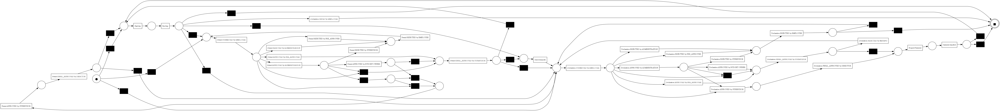

In [21]:
from pm4py.visualization.petri_net import visualizer as pn_visualizer
dfg, start_activities, end_activities = pm4py.discover_dfg(filtered_log)
gviz = pm4py.visualization.dfg.visualizer.apply(dfg)
pn_visualizer.view(gviz)

In [8]:
# net, im, fm = pm4py.discover_petri_net_alpha(filtered_log)   ## alfa miner ig
# from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
 
# # Discover the Petri Net using the Heuristic Miner
# net, im, fm = heuristics_miner.apply(filtered_log)

from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
from pm4py.visualization.petri_net import visualizer as pn_visualizer
 
# Parameters for Heuristics Miner
parameters = {
    "dependency_thresh": 0.8,  # Dependency threshold
    "and_measure_thresh": 0.65,  # AND threshold
    "loop_length_two_thresh": 0.5,  # Loop threshold
    "noise_thresh": 0.2,  # Noise threshold
}
 
# Apply Heuristics Miner with parameters
net, im, fm = heuristics_miner.apply(filtered_log, parameters=parameters)
 
# Visualize the resulting Petri net
gviz = pn_visualizer.apply(net, im, fm)
pn_visualizer.view(gviz)


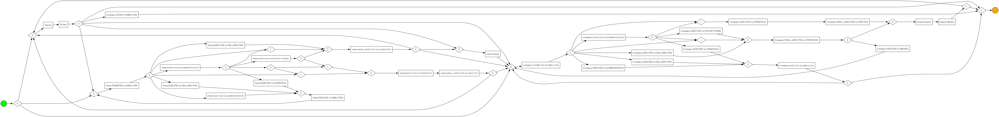

In [22]:
# gviz = pm4py.visualization.petri_net.visualizer.apply(net, im, fm)
# pn_visualizer.view(gviz)


In [16]:
bpmn = pm4py.convert_to_bpmn(net, im, fm)

gviz = pm4py.visualization.bpmn.visualizer.apply(bpmn)
pn_visualizer.view(gviz)

BPMN file exported to: process_model.bpmn


In [23]:
# Define the BPMN file path
bpmn_file_path = "process_model.bpmn"

# Export the BPMN model to a BPMN file
pm4py.write_bpmn(bpmn, bpmn_file_path)

print(f"BPMN file exported to: {bpmn_file_path}")

Variants and their corresponding cases:
Variant: ('Start trip', 'End trip', 'Permit SUBMITTED by EMPLOYEE', 'Permit FINAL_APPROVED by SUPERVISOR', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled'), Cases: [{'attributes': {'Permit travel permit number': 'travel permit number 76456', 'DeclarationNumber': 'declaration number 76458', 'Amount': 39.66456144659199, 'RequestedAmount': 39.66456144659199, 'Permit TaskNumber': 'UNKNOWN', 'Permit BudgetNumber': 'budget 922', 'OriginalAmount': 39.66456144659199, 'Permit ProjectNumber': 'UNKNOWN', 'concept:name': 'declaration 76457', 'Permit OrganizationalEntity': 'organizational unit 65458', 'travel permit number': 'travel permit number 76456', 'Permit RequestedBudget': 41.613444658859, 'id': 'declaration 76457', 'Permit ID': 'travel permit 76455', 'Permit id': 'travel permit 76455', 'BudgetNumber': 'budget 144133', 'Permit ActivityNumber': 'activity 46005', 'AdjustedAmount': 39.6

In [11]:
## Variant analysis
from pm4py.algo.filtering.log.variants import variants_filter

variants = variants_filter.get_variants(filtered_log)

print("Variants and their corresponding cases:")
for variant, cases in variants.items():
    print(f"Variant: {variant}, Cases: {cases}, Count: {len(cases)}")



Least frequent variant: ('Start trip', 'Permit SUBMITTED by EMPLOYEE', 'Permit APPROVED by ADMINISTRATION', 'Permit APPROVED by SUPERVISOR', 'Permit FINAL_APPROVED by DIRECTOR', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled', 'End trip') (Count: 10)
BPMN file for the least frequent variant exported to: least_frequent_variant.bpmn


In [10]:
from pm4py.algo.filtering.log.variants import variants_filter
from pm4py.objects.log.util import interval_lifecycle
from pm4py.objects.conversion.log import converter as log_converter
from pm4py.visualization.bpmn import visualizer as bpmn_visualizer
from pm4py.objects.conversion.process_tree import converter as pt_converter
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
 
# Step 1: Get variants from the filtered log
variants = variants_filter.get_variants(filtered_log)
 
# Step 2: Find the variant with the minimum count
least_frequent_variant = None
min_count = float('inf')  # Start with infinity
 
for variant, cases in variants.items():
    if len(cases) < min_count:
        least_frequent_variant = variant
        min_count = len(cases)
 
print(f"\nLeast frequent variant: {least_frequent_variant} (Count: {min_count})")
 
# Step 3: Create a new log containing only cases of the least frequent variant
least_frequent_variant_cases = variants[least_frequent_variant]
least_frequent_variant_log = pm4py.objects.log.obj.EventLog()
 
for case in least_frequent_variant_cases:
    least_frequent_variant_log.append(case)
 
# Step 4: Discover the process model (Process Tree -> Petri net -> BPMN)
process_tree = inductive_miner.apply(least_frequent_variant_log, variant=inductive_miner.Variants.IMf)
net, im, fm = pt_converter.apply(process_tree)
 
# Step 5: Convert to BPMN
bpmn_model = pm4py.convert_to_bpmn(net, im, fm)
 
# Step 6: Visualize the BPMN
bpmn_visualizer.apply(bpmn_model)
 
# Step 7: Export BPMN to a file
bpmn_file_path = "least_frequent_variant.bpmn"
pm4py.write_bpmn(bpmn_model, bpmn_file_path)
 
print(f"BPMN file for the least frequent variant exported to: {bpmn_file_path}")


Least frequent variant: ('Permit SUBMITTED by EMPLOYEE', 'Permit APPROVED by SUPERVISOR', 'Permit FINAL_APPROVED by DIRECTOR', 'Start trip', 'End trip', 'Declaration SUBMITTED by EMPLOYEE', 'Permit REJECTED by MISSING', 'Permit SUBMITTED by EMPLOYEE', 'Permit APPROVED by PRE_APPROVER', 'Permit FINAL_APPROVED by SUPERVISOR', 'Declaration APPROVED by PRE_APPROVER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled') (Count: 1)
BPMN file for the least frequent variant exported to: least_frequent_variant.bpmn


In [8]:
from pm4py.algo.filtering.log.variants import variants_filter
from pm4py.objects.log.util import interval_lifecycle
from pm4py.objects.conversion.log import converter as log_converter
from pm4py.visualization.bpmn import visualizer as bpmn_visualizer
from pm4py.objects.conversion.process_tree import converter as pt_converter
from pm4py.algo.discovery.inductive import algorithm as inductive_miner

# Step 1: Get variants from the filtered log
variants = variants_filter.get_variants(filtered_log)

# Step 2: Find the variant with the maximum count
most_frequent_variant = None
max_count = 0  # Start with zero

for variant, cases in variants.items():
    if len(cases) > max_count:
        most_frequent_variant = variant
        max_count = len(cases)

print(f"\nMost frequent variant: {most_frequent_variant} (Count: {max_count})")

# Step 3: Create a new log containing only cases of the most frequent variant
most_frequent_variant_cases = variants[most_frequent_variant]
most_frequent_variant_log = pm4py.objects.log.obj.EventLog()

for case in most_frequent_variant_cases:
    most_frequent_variant_log.append(case)

# Step 4: Discover the process model (Process Tree -> Petri net -> BPMN)
process_tree = inductive_miner.apply(most_frequent_variant_log, variant=inductive_miner.Variants.IMf)
net, im, fm = pt_converter.apply(process_tree)

# Step 5: Convert to BPMN
bpmn_model = pm4py.convert_to_bpmn(net, im, fm)

# Step 6: Visualize the BPMN
bpmn_visualizer.apply(bpmn_model)

# Step 7: Export BPMN to a file
bpmn_file_path = "most_frequent_variant.bpmn"
pm4py.write_bpmn(bpmn_model, bpmn_file_path)

print(f"BPMN file for the most frequent variant exported to: {bpmn_file_path}")



Most frequent variant: ('Permit SUBMITTED by EMPLOYEE', 'Permit FINAL_APPROVED by SUPERVISOR', 'Start trip', 'End trip', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled') (Count: 354)
BPMN file for the most frequent variant exported to: most_frequent_variant.bpmn


In [26]:
# Discover a ProcessTree using the Inductive Miner on the filtered log
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
process_tree = inductive_miner.apply(filtered_log, variant=inductive_miner.Variants.IMf)

# Convert the ProcessTree to a Petri net
from pm4py.objects.conversion.process_tree import converter as pt_converter
net, im, fm = pt_converter.apply(process_tree)

# Perform alignment-based conformance checking
from pm4py.algo.conformance.alignments.petri_net import algorithm as alignments

# Calculate alignments on the filtered log
alignment_result = alignments.apply(filtered_log, net, im, fm)

# Analyze alignment results
print("\nAlignment-based Conformance Checking Results:")
for i, alignment in enumerate(alignment_result[:5]):  # Display results for the first 5 traces
    print(f"\nTrace {i + 1}:")
    print(f"Cost: {alignment['cost']}")
    print(f"Fitness: {alignment['fitness']:.2f}")
    print("Moves on log and model:")
    for move in alignment['alignment']:
        print(move)

# Calculate overall log fitness based on alignments
average_fitness = sum(alignment["fitness"] for alignment in alignment_result) / len(alignment_result)
print(f"\nOverall Log Fitness (Alignment-Based): {average_fitness:.2f}")


aligning log, completed variants :: 100%|██████████| 75/75 [00:02<00:00, 33.04it/s]


Alignment-based Conformance Checking Results:

Trace 1:
Cost: 18
Fitness: 1.00
Moves on log and model:
('>>', None)
('>>', None)
('>>', None)
('Start trip', 'Start trip')
('End trip', 'End trip')
('Permit SUBMITTED by EMPLOYEE', 'Permit SUBMITTED by EMPLOYEE')
('>>', None)
('>>', None)
('>>', None)
('Permit FINAL_APPROVED by SUPERVISOR', 'Permit FINAL_APPROVED by SUPERVISOR')
('>>', None)
('>>', None)
('>>', None)
('>>', None)
('Declaration SUBMITTED by EMPLOYEE', 'Declaration SUBMITTED by EMPLOYEE')
('>>', None)
('>>', None)
('>>', None)
('Declaration FINAL_APPROVED by SUPERVISOR', 'Declaration FINAL_APPROVED by SUPERVISOR')
('>>', None)
('>>', None)
('>>', None)
('Request Payment', 'Request Payment')
('Payment Handled', 'Payment Handled')
('>>', None)
('>>', None)

Trace 2:
Cost: 18
Fitness: 1.00
Moves on log and model:
('>>', None)
('>>', None)
('>>', None)
('Start trip', 'Start trip')
('End trip', 'End trip')
('Permit SUBMITTED by EMPLOYEE', 'Permit SUBMITTED by EMPLOYEE')
('>>', 

In [27]:
import pm4py
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Step 3: Create a DataFrame from the filtered event log
df = pm4py.convert_to_dataframe(filtered_log)

# Step 4: Feature engineering - Add lagged features for next activity prediction
df['next_activity'] = df.groupby('case:concept:name')['concept:name'].shift(-1)
df = df.dropna(subset=['next_activity'])  # Drop rows with no next activity

# Step 5: Encode categorical variables into numbers
df['activity_encoded'] = df['concept:name'].astype('category').cat.codes
df['next_activity_encoded'] = df['next_activity'].astype('category').cat.codes

# Step 6: Prepare features and labels
X = df[['activity_encoded']]  # Feature: current activity
y = df['next_activity_encoded']  # Label: next activity

# Step 7: Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Step 8: Train a Random Forest Classifier
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Step 9: Evaluate the model
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Model Accuracy: {accuracy * 100:.2f}%")

# Step 10: Predict the next activity for a sample case
sample = pd.DataFrame({'activity_encoded': [X_test.iloc[0, 0]]})  # Use the first test sample
predicted_next_activity = model.predict(sample)
print(f"Predicted Next Activity (encoded): {predicted_next_activity[0]}")

# Optional: Decode the predicted activity back to its original label
activity_mapping = dict(enumerate(df['concept:name'].astype('category').cat.categories))
print(f"Predicted Next Activity (decoded): {activity_mapping[predicted_next_activity[0]]}")


Model Accuracy: 83.73%
Predicted Next Activity (encoded): 20
Predicted Next Activity (decoded): Permit REJECTED by ADMINISTRATION


In [13]:
import pm4py
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder

# Step 1: Convert the filtered event log to a DataFrame
df = pm4py.convert_to_dataframe(filtered_log)

# Step 2: Feature Engineering - Add the next activity column
df['next_activity'] = df.groupby('case:concept:name')['concept:name'].shift(-1)
df = df.dropna(subset=['next_activity'])  # Drop rows where next activity is missing

# Step 3: Encode categorical variables into numbers
encoder = LabelEncoder()
df['activity_encoded'] = encoder.fit_transform(df['concept:name'])
df['next_activity_encoded'] = encoder.fit_transform(df['next_activity'])

# Step 4: Prepare Features (X) and Labels (y)
X = df[['activity_encoded']]  # Feature: current activity
y = df['next_activity_encoded']  # Label: next activity

# Step 5: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Step 6: Train XGBoost Model for Next Activity Prediction
xgb_model = xgb.XGBClassifier(objective='multi:softmax', num_class=len(df['next_activity_encoded'].unique()), 
                              n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
xgb_model.fit(X_train, y_train)

# Step 7: Evaluate Model Accuracy
y_pred = xgb_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"✅ XGBoost Model Accuracy: {accuracy * 100:.2f}%")

# Step 8: Predict Next Activity for a Sample Case
sample = pd.DataFrame({'activity_encoded': [X_test.iloc[0, 0]]})  # Use first test sample
predicted_next_activity = xgb_model.predict(sample)

# Step 9: Decode Predicted Activity
predicted_activity_label = encoder.inverse_transform([predicted_next_activity[0]])[0]

# Display prediction result
print(f"🔹 Predicted Next Activity: {predicted_activity_label}")

# Step 10: Display Predictions as a DataFrame
df_test_results = X_test.copy()
df_test_results['actual_next_activity'] = encoder.inverse_transform(y_test)
df_test_results['predicted_next_activity'] = encoder.inverse_transform(y_pred)

df_test_results


✅ XGBoost Model Accuracy: 83.73%
🔹 Predicted Next Activity: Permit FINAL_APPROVED by SUPERVISOR


,activity_encoded,actual_next_activity,predicted_next_activity
14282,14,Permit FINAL_APPROVED by SUPERVISOR,Permit FINAL_APPROVED by SUPERVISOR
45733,14,Permit FINAL_APPROVED by SUPERVISOR,Permit FINAL_APPROVED by SUPERVISOR
9895,27,End trip,End trip
48614,27,Permit FINAL_APPROVED by SUPERVISOR,End trip
47904,11,Declaration REJECTED by ADMINISTRATION,Declaration APPROVED by ADMINISTRATION
...,...,...,...
33931,1,Declaration FINAL_APPROVED by SUPERVISOR,Declaration FINAL_APPROVED by SUPERVISOR
7764,11,Declaration APPROVED by PRE_APPROVER,Declaration APPROVED by ADMINISTRATION
42089,19,Start trip,Start trip
5732,27,End trip,End trip


In [ ]:
##ObjectCentricProcessMining

## Creating csv

import pm4py
import pandas as pd

xes_file = "InternationalDeclarations.xes"
log = pm4py.read_xes(xes_file)

df = pm4py.convert_to_dataframe(log)

csv_file = "csv_file.csv"
df.to_csv(csv_file, index=False)

In [ ]:
##Creating jsonocel file out of csv
import pandas as pd
from pm4py.objects.ocel.importer import csv as ocel_csv_importer
from pm4py.objects.ocel.exporter import jsonocel as ocel_json_exporter

# 🔹 Step 1: Load CSV File
csv_file = "csv_file.csv"  # Change this to your CSV filename
df = pd.read_csv(csv_file)

# 🔹 Step 2: Convert CSV to OCEL format
ocel = ocel_csv_importer.apply(df)

# 🔹 Step 3: Save as JSON-OCEL
jsonocel_file = "fixed_ocel_v3.jsonocel"  # Change output filename if needed
ocel_json_exporter.apply(ocel, jsonocel_file)

print(f"✅ Conversion complete! JSON-OCEL saved as: {jsonocel_file}")


In [ ]:
##Ensuring jsonocel file is done right
import json

# Load the OCEL file
ocel_file_path = "fixed_ocel_v3.jsonocel"

with open(ocel_file_path, "r") as f:
    ocel_data = json.load(f)

# Ensure `ocel:events` is a dictionary
if isinstance(ocel_data["ocel:events"], list):
    ocel_events_dict = {
        event["ocel:eid"]: {
            "ocel:activity": event["ocel:activity"],
            "ocel:timestamp": event["ocel:timestamp"],
            "ocel:omap": event["ocel:omap"],
            "ocel:vmap": event.get("ocel:vmap", {})  # Ensure `ocel:vmap` exists
        }
        for event in ocel_data["ocel:events"]
    }
else:
    ocel_events_dict = {
        eid: {
            **event,
            "ocel:vmap": event.get("ocel:vmap", {})
        }
        for eid, event in ocel_data["ocel:events"].items()
    }

# Ensure `ocel:objects` is a dictionary and add `ocel:ovmap`
if isinstance(ocel_data["ocel:objects"], list):
    ocel_objects_dict = {
        obj["ocel:oid"]: {
            "ocel:type": obj["ocel:type"],
            "ocel:ovmap": obj.get("ocel:ovmap", {})  # Add `ocel:ovmap`
        }
        for obj in ocel_data["ocel:objects"]
    }
else:
    ocel_objects_dict = {
        oid: {
            **obj,
            "ocel:ovmap": obj.get("ocel:ovmap", {})  # Ensure `ocel:ovmap` exists
        }
        for oid, obj in ocel_data["ocel:objects"].items()
    }

# Add missing `ocel:global-log`
ocel_global_log = {
    "ocel:attribute-names": ["ocel:activity", "ocel:timestamp"],
    "ocel:object-types": list(set(obj["ocel:type"] for obj in ocel_objects_dict.values())),
    "ocel:version": "1.0"
}

# Create the final OCEL format expected by `ocpa`
fixed_ocel_data = {
    "ocel:global-log": ocel_global_log,
    "ocel:events": ocel_events_dict,
    "ocel:objects": ocel_objects_dict,
}

# Save the updated OCEL file
final_ocel_file_path = "final_ocel_v4.jsonocel"
with open(final_ocel_file_path, "w") as f:
    json.dump(fixed_ocel_data, f, indent=4)

print(f"✅ Final OCEL log successfully saved as {final_ocel_file_path}")


In [ ]:
from ocpa.objects.log.importer.ocel import factory as ocel_import_factory
filename = "final_ocel_v4.jsonocel"
ocel = ocel_import_factory.apply(filename)


In [ ]:
##Visualized object-centric Petri net
from ocpa.objects.log.importer.ocel import factory as ocel_import_factory
from ocpa.algo.discovery.ocpn import algorithm as ocpn_discovery_factory
from ocpa.visualization.oc_petri_net import factory as ocpn_vis_factory
filename = "final_ocel_v4.jsonocel"
ocel = ocel_import_factory.apply(file_path=filename)
ocpn = ocpn_discovery_factory.apply(ocel, parameters={"debug": False, "discovery_algorithm": "petri_net"})
ocpn_vis_factory.save(ocpn_vis_factory.apply(ocpn), "oc_petri_net.png")

In [ ]:
##Variant Calculation and Layouting
from ocpa.objects.log.importer.ocel import factory as ocel_import_factory
from ocpa.visualization.log.variants import factory as variants_visualization_factory
filename = "final_ocel_v4.jsonocel"
ocel = ocel_import_factory.apply(filename)
print("Number of process executions: "+str(len(ocel.process_executions)))
print("Number of variants: "+str(len(ocel.variants)))
variant_layouting = variants_visualization_factory.apply(ocel)
print(variant_layouting[ocel.variants[0]])
##further filtration and analysis needed